In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import keras
import cv2
import pickle
import sklearn
import scipy

from skimage import io
from skimage.transform import resize
from sklearn.metrics import auc, f1_score, roc_curve, recall_score, precision_score, accuracy_score, confusion_matrix
from sklearn import metrics
from google.colab import files
from keras.preprocessing import image
from keras.layers.serialization import activation
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import *
from keras.layers import Dense, GlobalAveragePooling2D
from keras.models import Model
from keras import backend as K
from tensorflow.keras import layers
from keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import applications
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense

#**Data directory**

In [2]:
base_dir = '/content/drive/MyDrive/TIFF PET-CTWholeDataset'

training_set_dir = os.path.join(base_dir, 'trainingSet')
test_set_dir = os.path.join(base_dir, 'testSet')

train_lungCancer_dir = os.path.join(training_set_dir, 'lungCancer')
train_normal_dir = os.path.join(training_set_dir, 'normal')
test_lungCancer_dir = os.path.join(test_set_dir, 'lungCancer')
test_normal_dir = os.path.join(test_set_dir, 'normal')

In [3]:
print('total training lungCancer images:', len(os.listdir(train_lungCancer_dir)))
print('total training normal images:', len(os.listdir(train_normal_dir)))
print('total test lungCancer images:', len(os.listdir(test_lungCancer_dir)))
print('total test normal images:', len(os.listdir(test_normal_dir)))

total training lungCancer images: 719
total training normal images: 726
total test lungCancer images: 199
total test normal images: 207


#**Checking patient overlap**

In [4]:
def check_data_leakage(directory1, directory2):
    filenames_dir1 = set(os.listdir(directory1))
    filenames_dir2 = set(os.listdir(directory2))

    common_filenames = filenames_dir1.intersection(filenames_dir2)

    if len(common_filenames) > 0:
        print("Data leakage detected!")
        print("Common image filenames between the directories:", common_filenames)
    else:
        print("No data leakage detected.")

In [5]:
check_data_leakage(train_lungCancer_dir, test_lungCancer_dir)
check_data_leakage(train_lungCancer_dir, test_normal_dir)
check_data_leakage(train_normal_dir, test_normal_dir)
check_data_leakage(train_normal_dir, test_lungCancer_dir)

No data leakage detected.
No data leakage detected.
No data leakage detected.
No data leakage detected.


#**Data generation**

In [6]:
BATCH_SIZE= 80
image_height, image_width = 350, 350

train_datagen = ImageDataGenerator(rescale=1.0/255.0,
                                  rotation_range= 15,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1,
                                  zoom_range=0.1,
                                  fill_mode='nearest')

train_generator = train_datagen.flow_from_directory(
        training_set_dir,
        target_size=(image_height, image_width),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle = True)


test_datagen = ImageDataGenerator(rescale=1.0/255.0)

test_generator = test_datagen.flow_from_directory(
        test_set_dir,
        target_size=(image_height, image_width),
        batch_size=10,
        class_mode='categorical')

Found 1445 images belonging to 2 classes.
Found 406 images belonging to 2 classes.


##**Defining model**

In [7]:
pre_trained_model = ResNet152V2(include_top=False,
                                        weights= 'imagenet',
                                        input_shape = (image_height, image_width, 3))

for layer in pre_trained_model.layers:
    layer.trainable = False

234545216/234545216 [==============================] - 7s 0us/step


In [8]:
pre_trained_model.summary()

Model: "resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 350, 350, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 356, 356, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 175, 175, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                        

In [9]:
last_layer = pre_trained_model.get_layer('post_relu')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

x = GlobalAveragePooling2D()(last_output)

x = Flatten()(x)

x = Dense(2, activation='softmax')(x)

model = Model(pre_trained_model.input, x)

last layer output shape:  (None, 11, 11, 2048)


In [10]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 350, 350, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 356, 356, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 175, 175, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [11]:
savingPath = os.makedirs('/content/sample_data/temporaryWeights')
checkpoint_path = '/content/sample_data/temporaryWeights'
checkpoint_dir = os.path.dirname(checkpoint_path)
print(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, save_weights_only=True, save_best_only=True, verbose= 1)

/content/sample_data/temporaryWeights


In [12]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate= 0.001), loss= 'categorical_crossentropy',
              metrics= [tf.keras.metrics.BinaryAccuracy(name="Binary_accuracy"),
                        tf.keras.metrics.Precision(name='Precision'),
                        tf.keras.metrics.Recall(name='Recall'),
                        tf.keras.metrics.TruePositives(name='TP'),
                        tf.keras.metrics.TrueNegatives(name='TN'),
                        tf.keras.metrics.FalseNegatives(name='FN'),
                        tf.keras.metrics.FalsePositives(name='FP'),
                        tf.keras.metrics.AUC(name='AUC')])

In [13]:
history = model.fit(
            train_generator,
            validation_data = test_generator,
            epochs = 20,
            verbose = 1,
            callbacks = [cp_callback])

Epoch 1/20
19/19 [==============================] - ETA: 0s - loss: 0.7296 - Binary_accuracy: 0.5599 - Precision: 0.5599 - Recall: 0.5599 - TP: 809.0000 - TN: 809.0000 - FN: 636.0000 - FP: 636.0000 - AUC: 0.5851
Epoch 1: val_loss improved from inf to 0.49344, saving model to /content/sample_data/temporaryWeights
19/19 [==============================] - 161s 6s/step - loss: 0.7296 - Binary_accuracy: 0.5599 - Precision: 0.5599 - Recall: 0.5599 - TP: 809.0000 - TN: 809.0000 - FN: 636.0000 - FP: 636.0000 - AUC: 0.5851 - val_loss: 0.4934 - val_Binary_accuracy: 0.7389 - val_Precision: 0.7389 - val_Recall: 0.7389 - val_TP: 300.0000 - val_TN: 300.0000 - val_FN: 106.0000 - val_FP: 106.0000 - val_AUC: 0.8621
Epoch 2/20
19/19 [==============================] - ETA: 0s - loss: 0.4375 - Binary_accuracy: 0.8208 - Precision: 0.8208 - Recall: 0.8208 - TP: 1186.0000 - TN: 1186.0000 - FN: 259.0000 - FP: 259.0000 - AUC: 0.9045
Epoch 2: val_loss improved from 0.49344 to 0.31931, saving model to /content/s

##**LoadingWeightsofTheResNet152V2Model**

In [14]:
model2 = Model(pre_trained_model.input, x)

In [15]:
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate= 0.001), loss= 'categorical_crossentropy',
              metrics= [tf.keras.metrics.BinaryAccuracy(name="Binary_accuracy"),
                        tf.keras.metrics.Precision(name='Precision'),
                        tf.keras.metrics.Recall(name='Recall'),
                        tf.keras.metrics.TruePositives(name='TP'),
                        tf.keras.metrics.TrueNegatives(name='TN'),
                        tf.keras.metrics.FalseNegatives(name='FN'),
                        tf.keras.metrics.FalsePositives(name='FP'),
                        tf.keras.metrics.AUC(name='AUC')])

In [16]:
model2.load_weights(checkpoint_path)

In [17]:
model2.evaluate(test_generator)

41/41 [==============================] - 11s 195ms/step - loss: 0.2307 - Binary_accuracy: 0.9113 - Precision: 0.9113 - Recall: 0.9113 - TP: 370.0000 - TN: 370.0000 - FN: 36.0000 - FP: 36.0000 - AUC: 0.9692


[0.23067064583301544,
 0.9113300442695618,
 0.9113300442695618,
 0.9113300442695618,
 370.0,
 370.0,
 36.0,
 36.0,
 0.9692361354827881]

##**Heatmap for uploaded PET/CT images from a cloud drive**

1/1 [==============================] - 0s 149ms/step


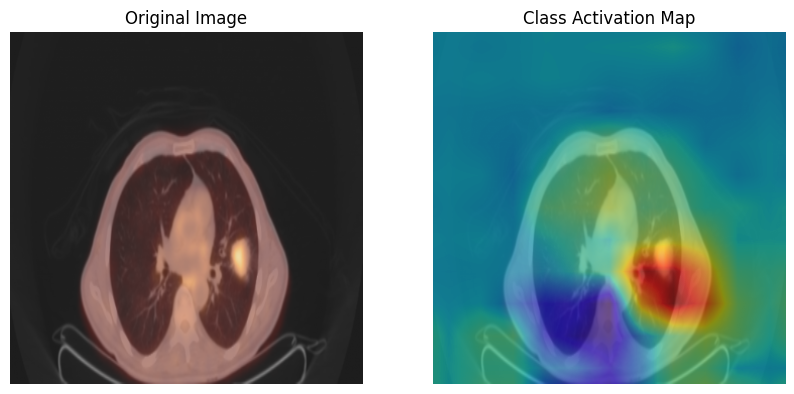

1/1 [==============================] - 0s 35ms/step


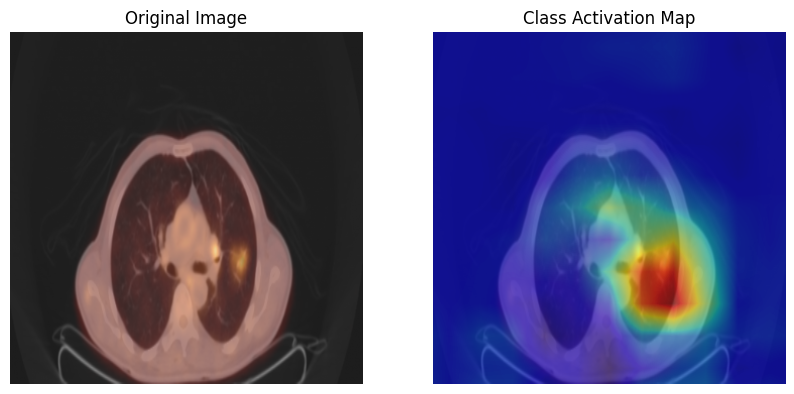

1/1 [==============================] - 0s 36ms/step


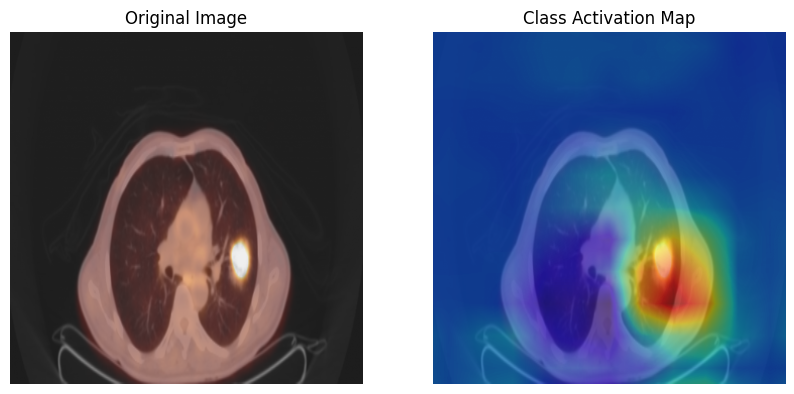

1/1 [==============================] - 0s 54ms/step


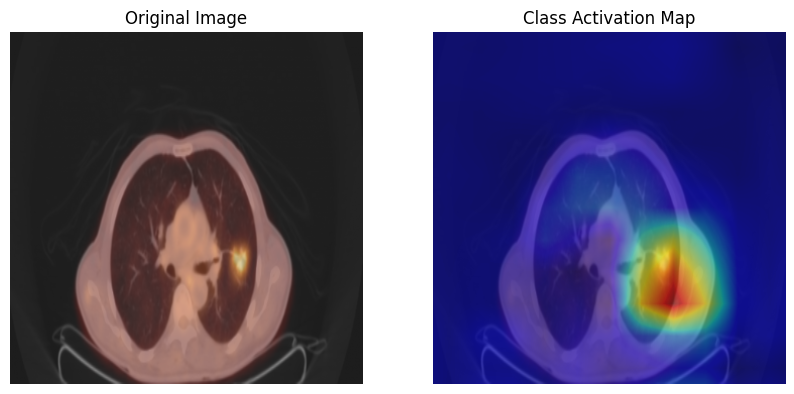

1/1 [==============================] - 0s 32ms/step


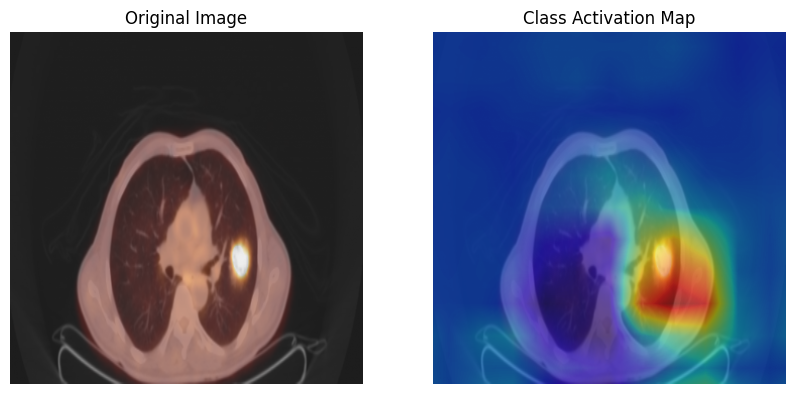

1/1 [==============================] - 0s 36ms/step


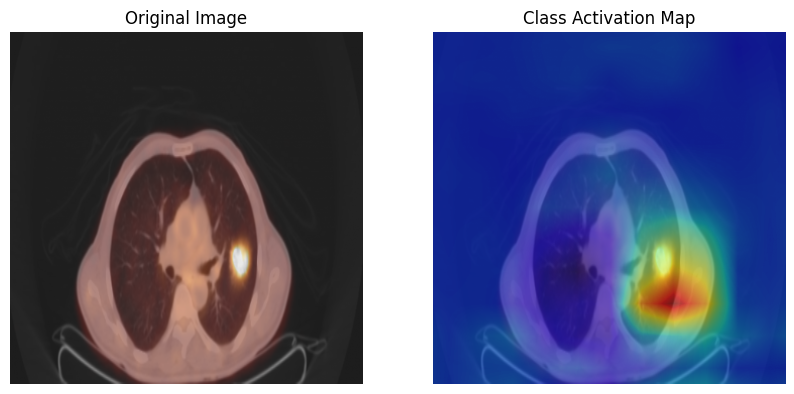

1/1 [==============================] - 0s 50ms/step


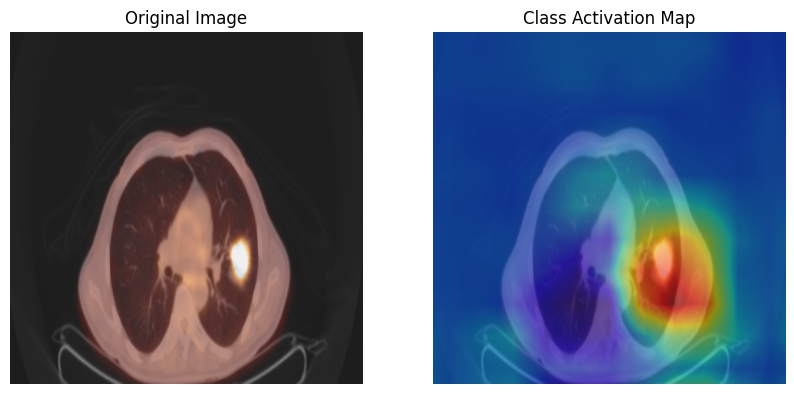

1/1 [==============================] - 0s 32ms/step


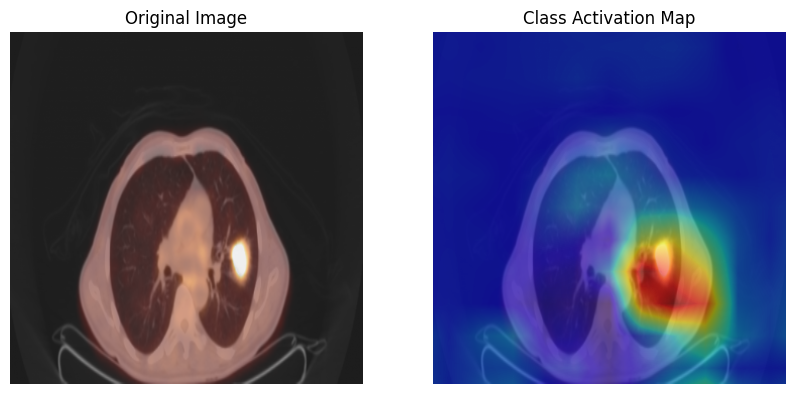

1/1 [==============================] - 0s 33ms/step


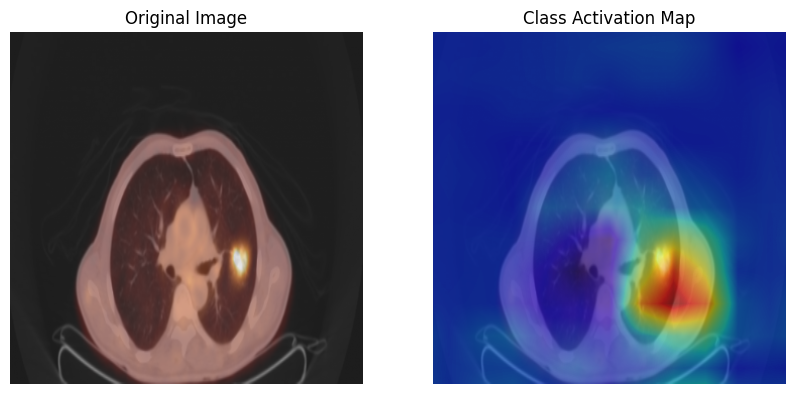

1/1 [==============================] - 0s 33ms/step


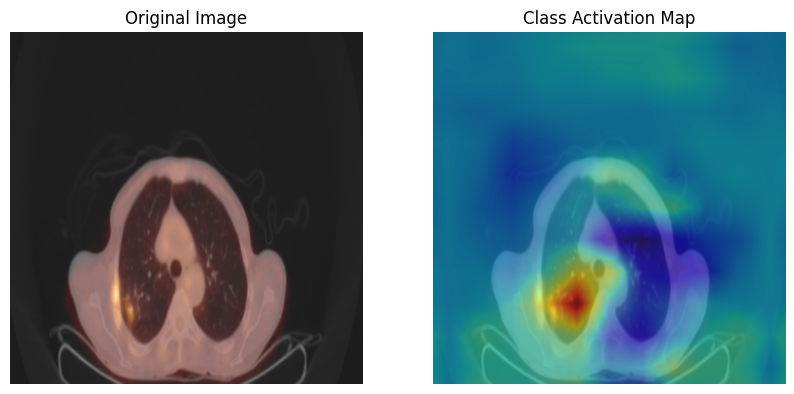

1/1 [==============================] - 0s 50ms/step


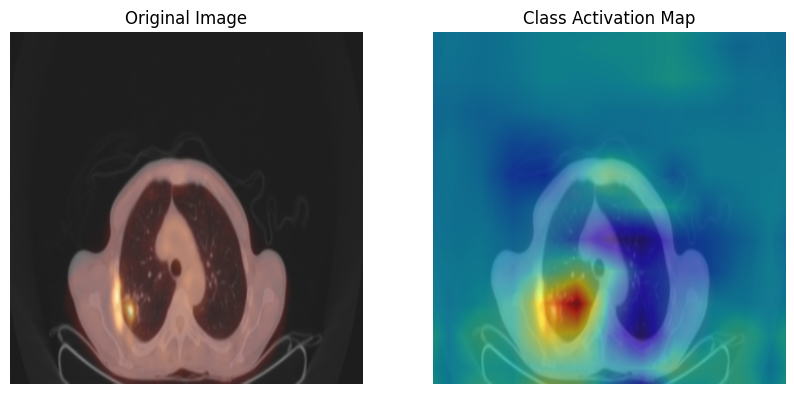

1/1 [==============================] - 0s 32ms/step


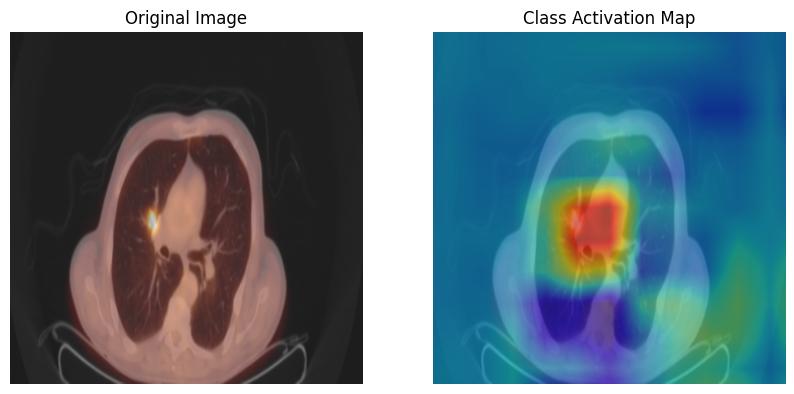

1/1 [==============================] - 0s 32ms/step


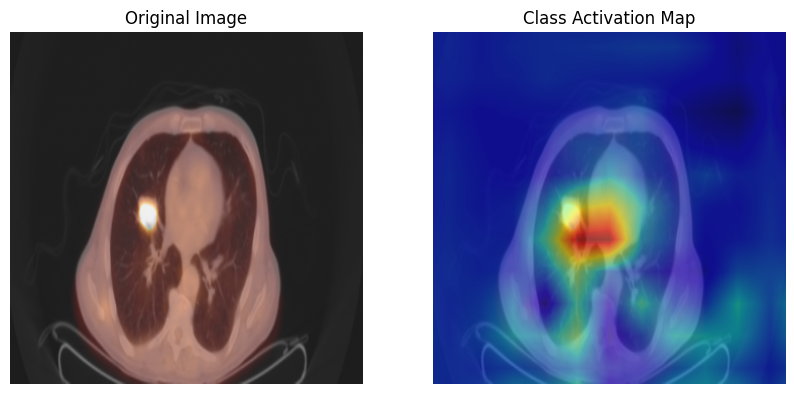

1/1 [==============================] - 0s 63ms/step


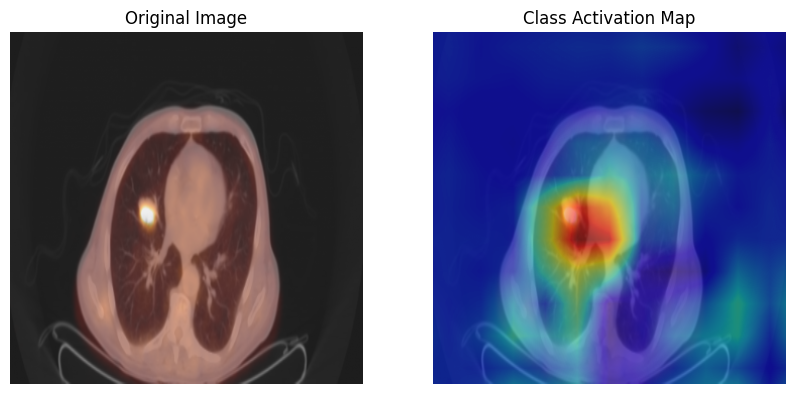

1/1 [==============================] - 0s 32ms/step


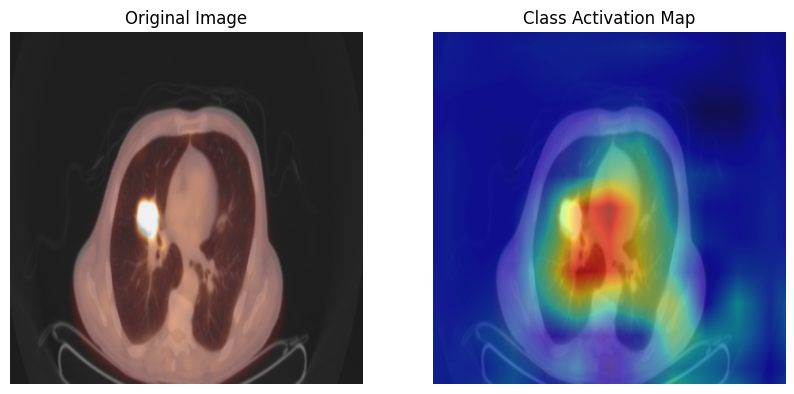

1/1 [==============================] - 0s 33ms/step


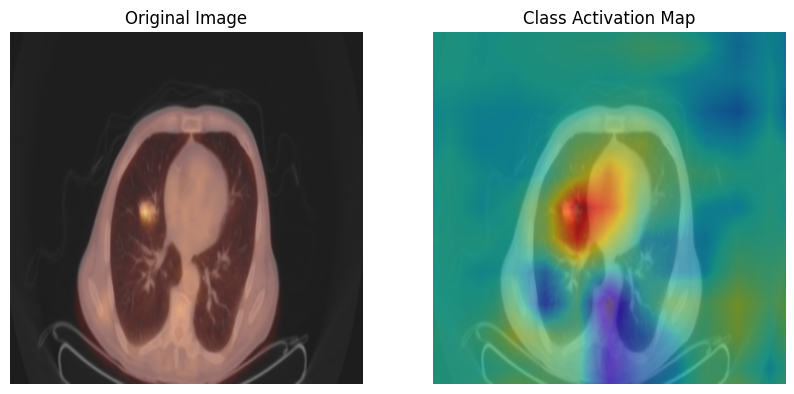

1/1 [==============================] - 0s 48ms/step


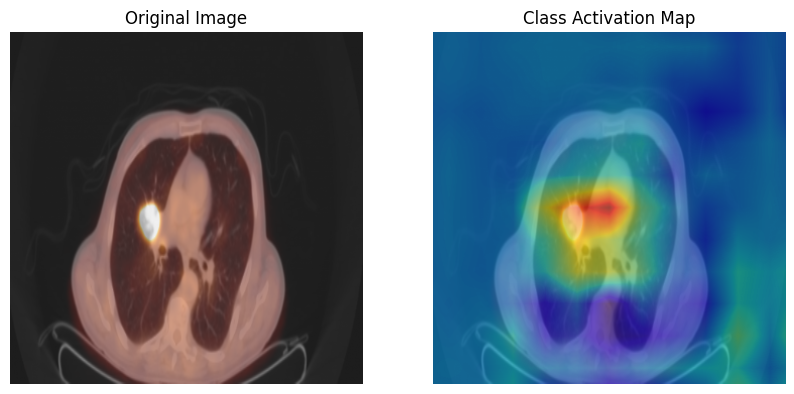

1/1 [==============================] - 0s 32ms/step


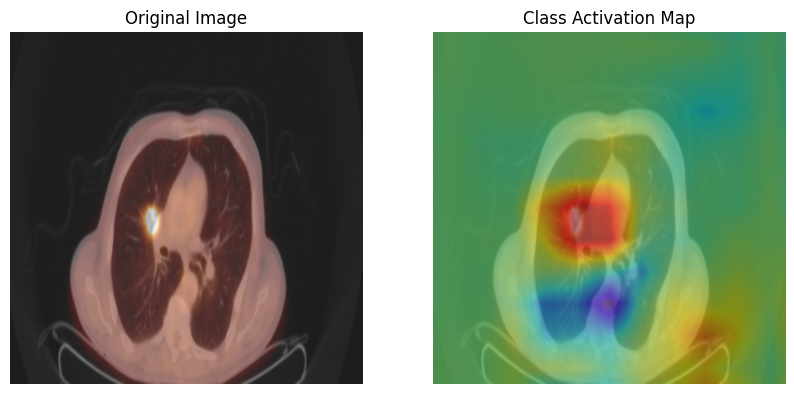

1/1 [==============================] - 0s 32ms/step


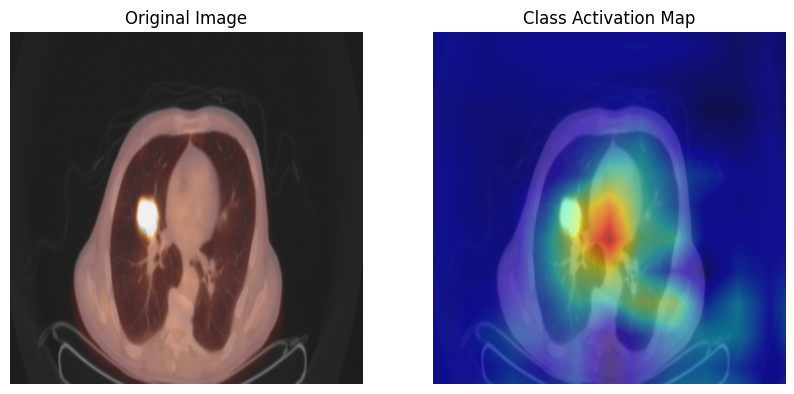

1/1 [==============================] - 0s 51ms/step


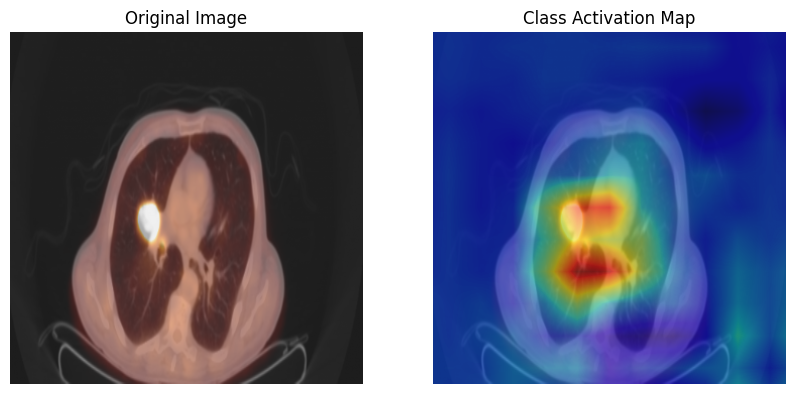

1/1 [==============================] - 0s 36ms/step


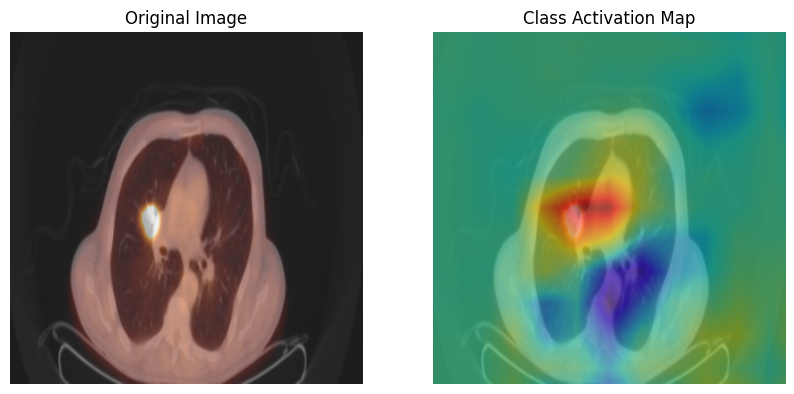

1/1 [==============================] - 0s 33ms/step


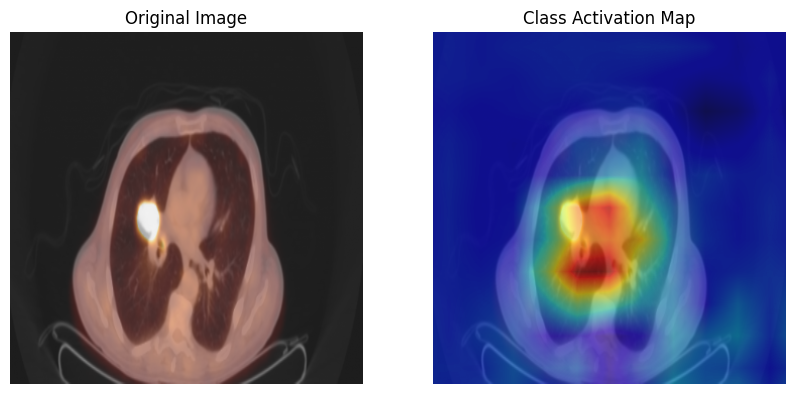

1/1 [==============================] - 0s 43ms/step


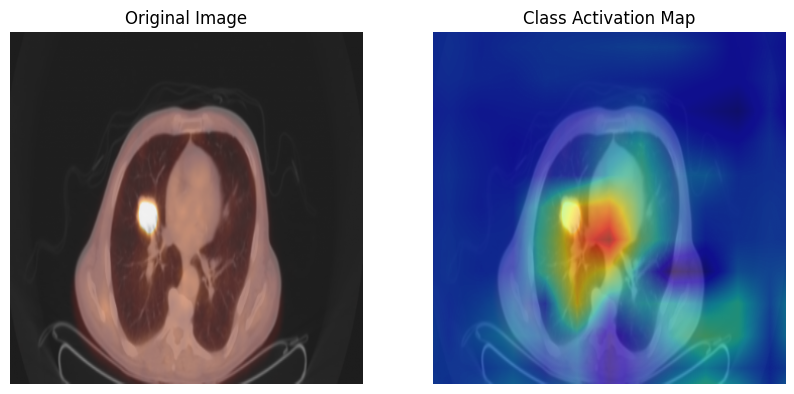

1/1 [==============================] - 0s 52ms/step


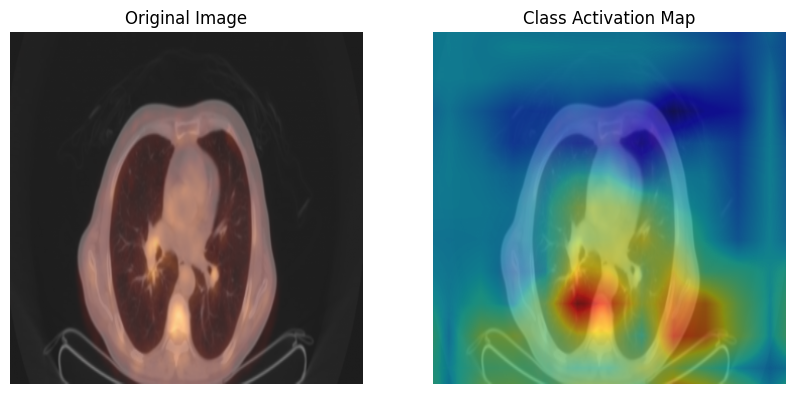

1/1 [==============================] - 0s 33ms/step


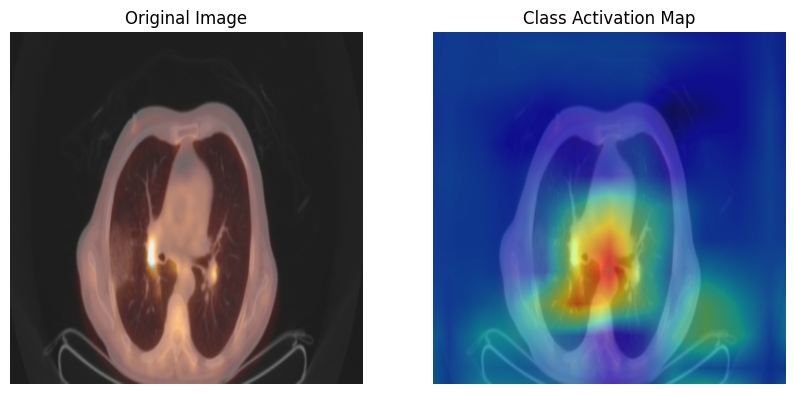

1/1 [==============================] - 0s 34ms/step


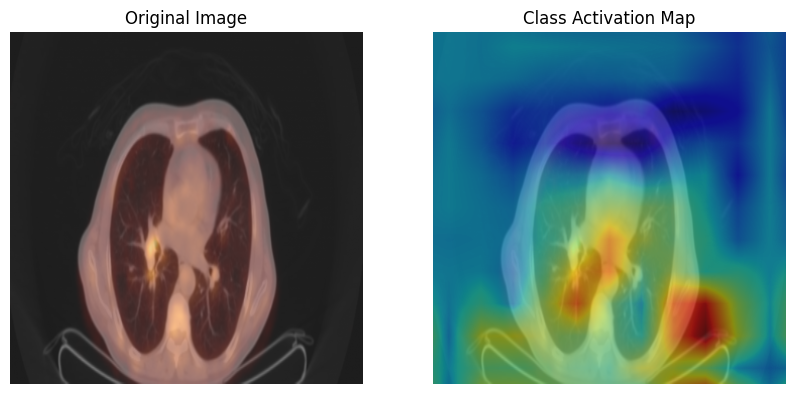

1/1 [==============================] - 0s 48ms/step


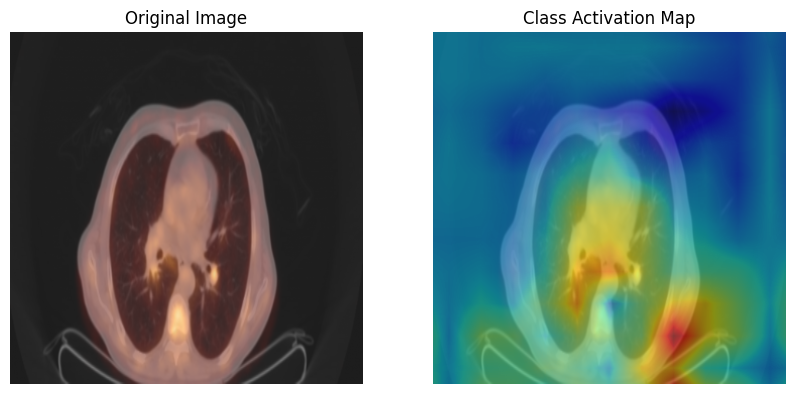

1/1 [==============================] - 0s 34ms/step


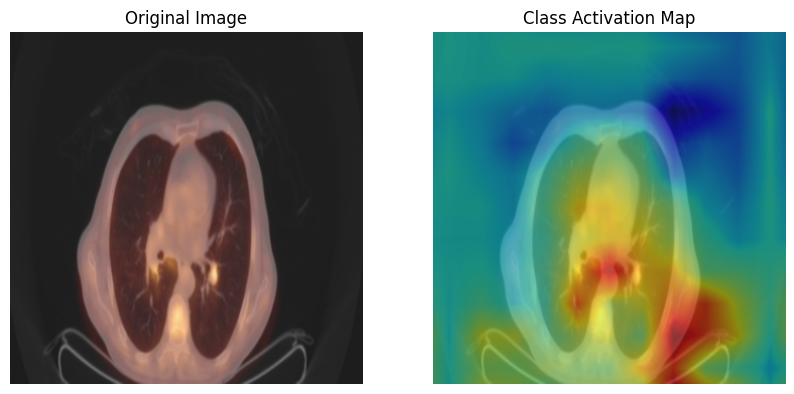

1/1 [==============================] - 0s 32ms/step


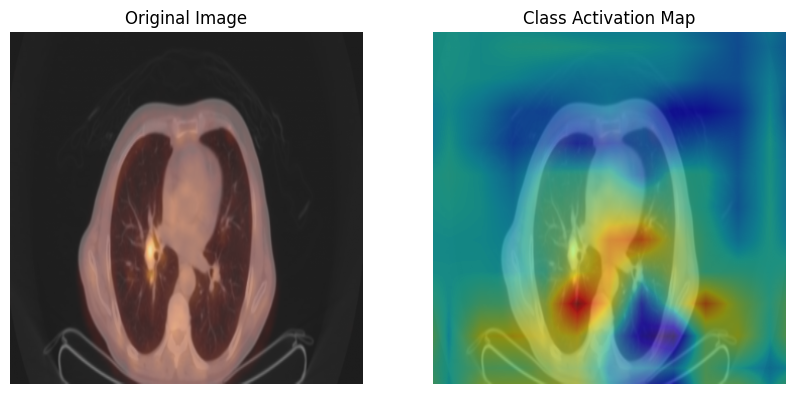

1/1 [==============================] - 0s 34ms/step


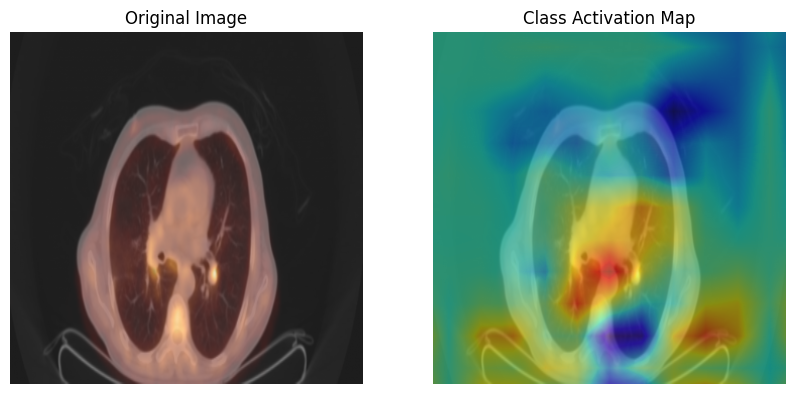

1/1 [==============================] - 0s 34ms/step


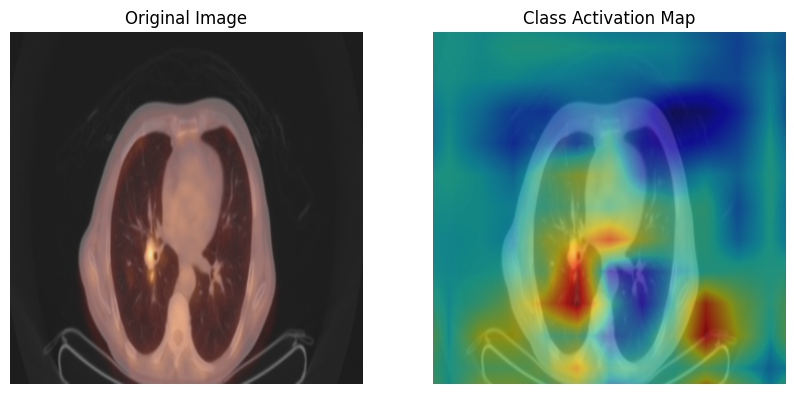

1/1 [==============================] - 0s 32ms/step


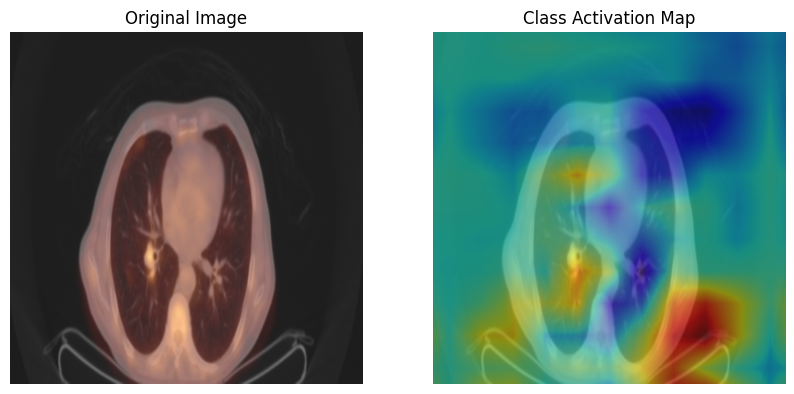

1/1 [==============================] - 0s 32ms/step


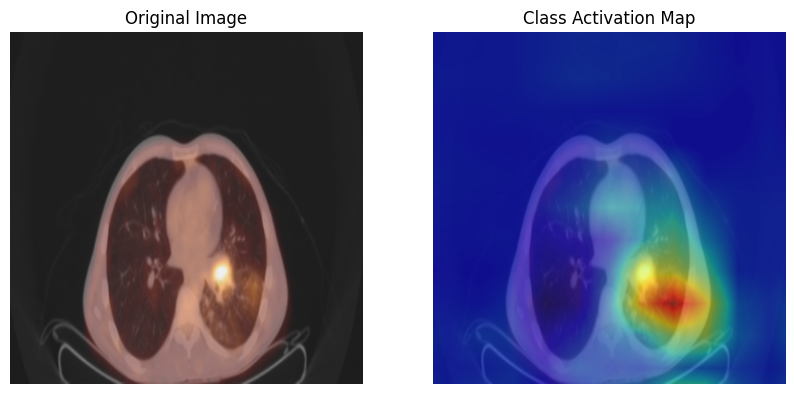

1/1 [==============================] - 0s 49ms/step


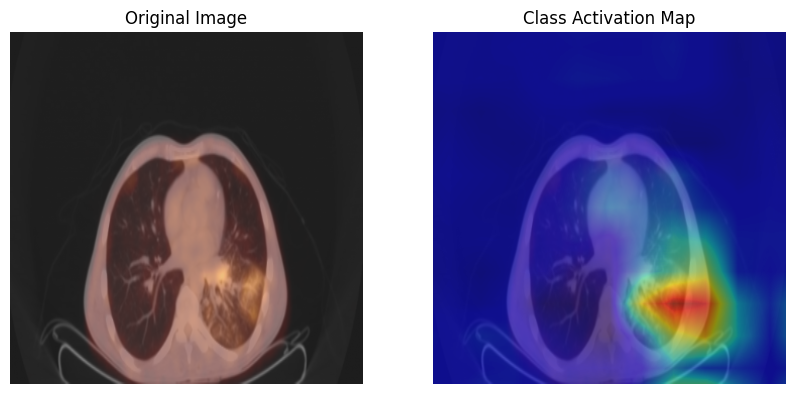

1/1 [==============================] - 0s 33ms/step


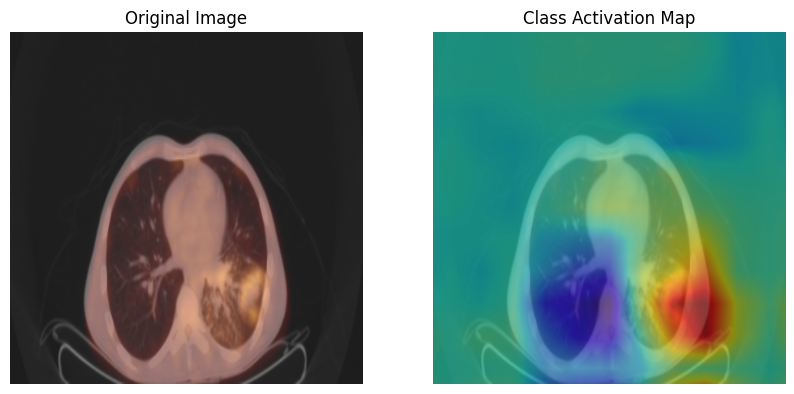

1/1 [==============================] - 0s 32ms/step


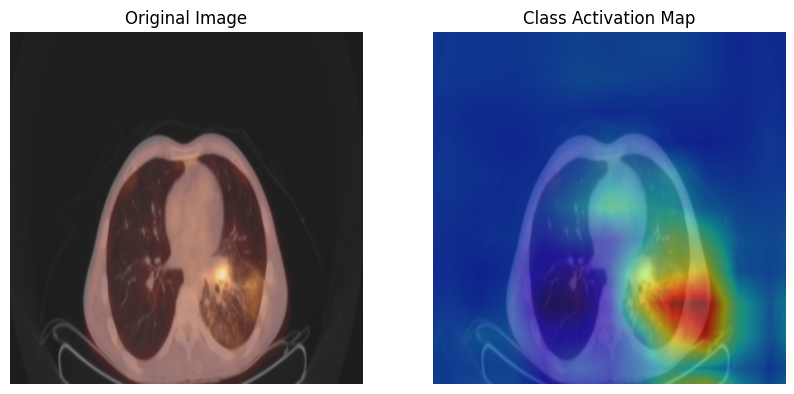

1/1 [==============================] - 0s 32ms/step


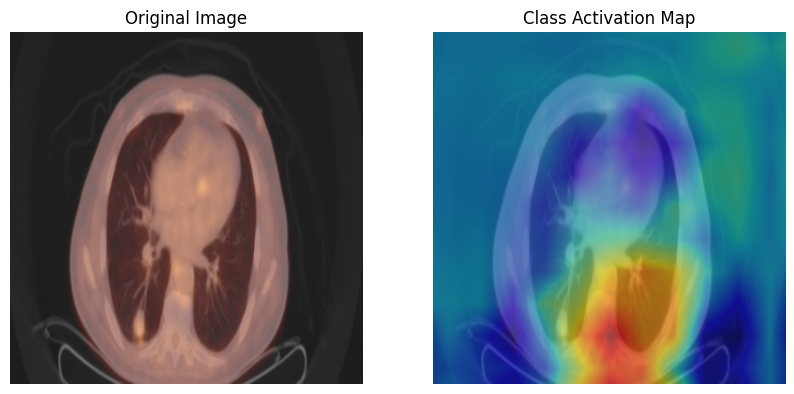

1/1 [==============================] - 0s 33ms/step


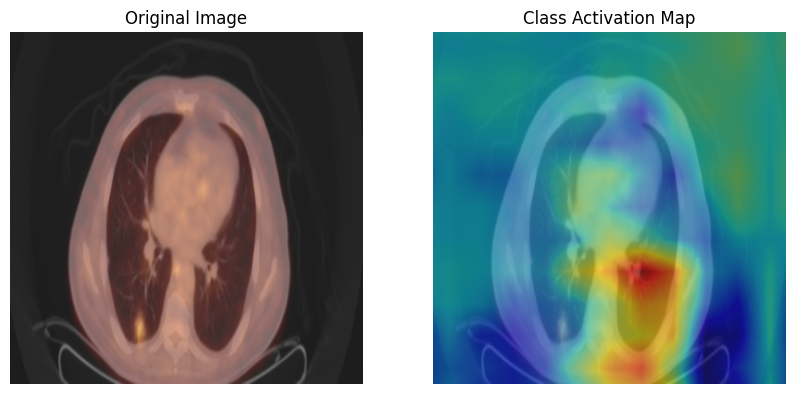

1/1 [==============================] - 0s 45ms/step


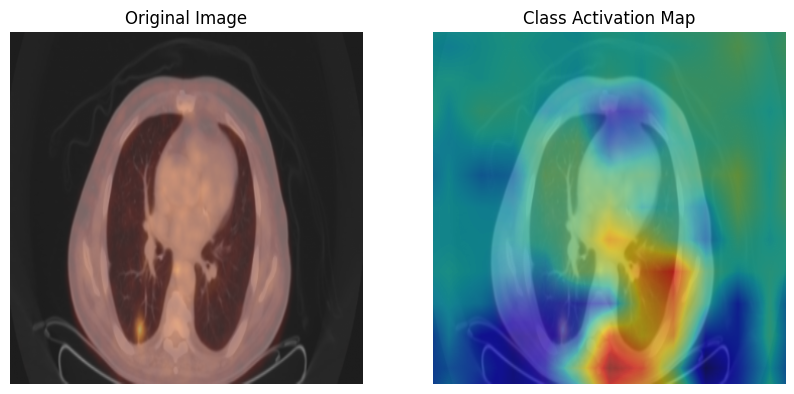

1/1 [==============================] - 0s 44ms/step


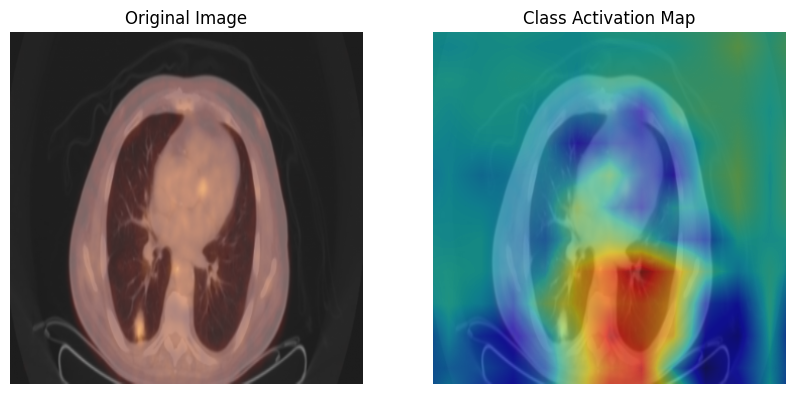

1/1 [==============================] - 0s 47ms/step


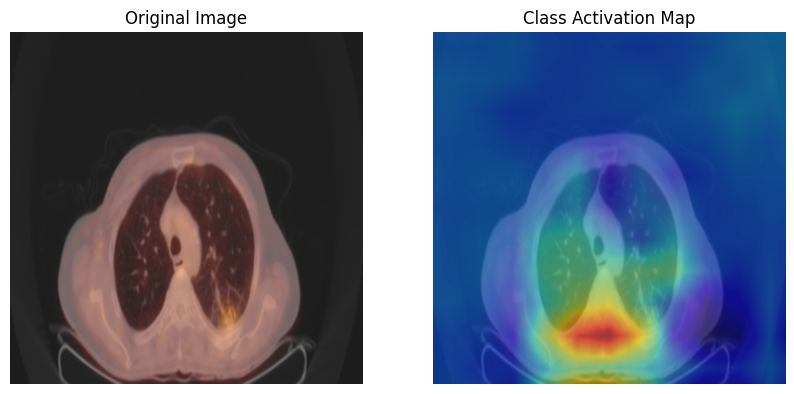

1/1 [==============================] - 0s 34ms/step


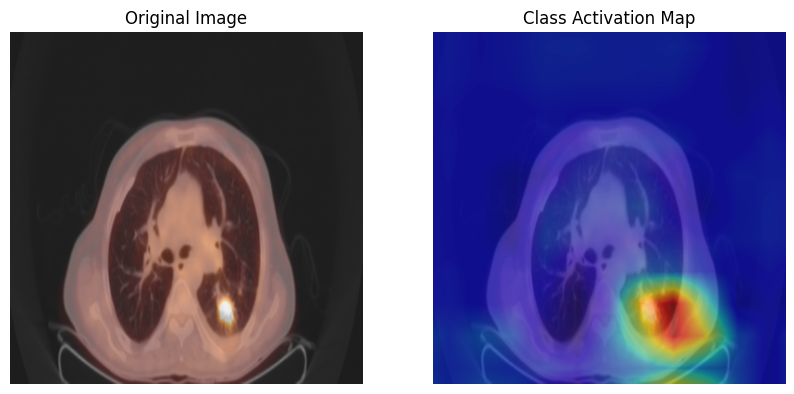

1/1 [==============================] - 0s 35ms/step


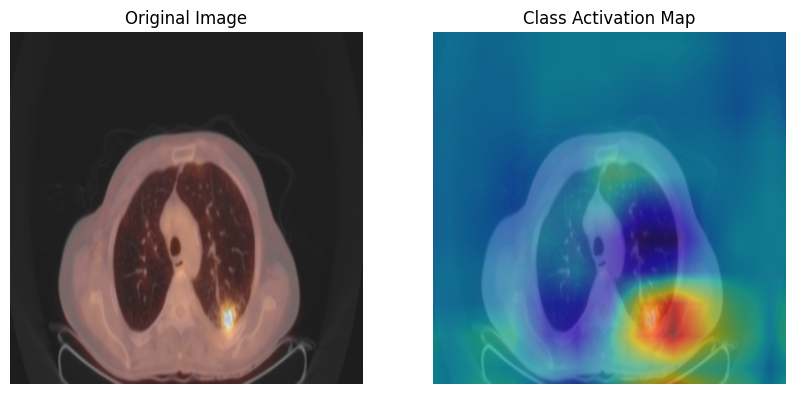

1/1 [==============================] - 0s 51ms/step


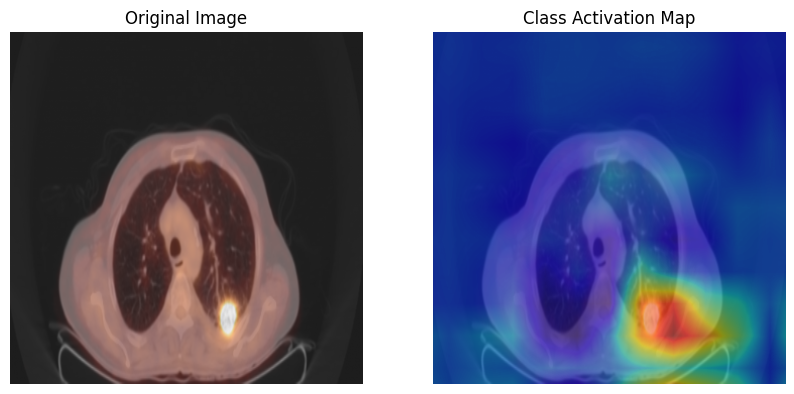

1/1 [==============================] - 0s 37ms/step


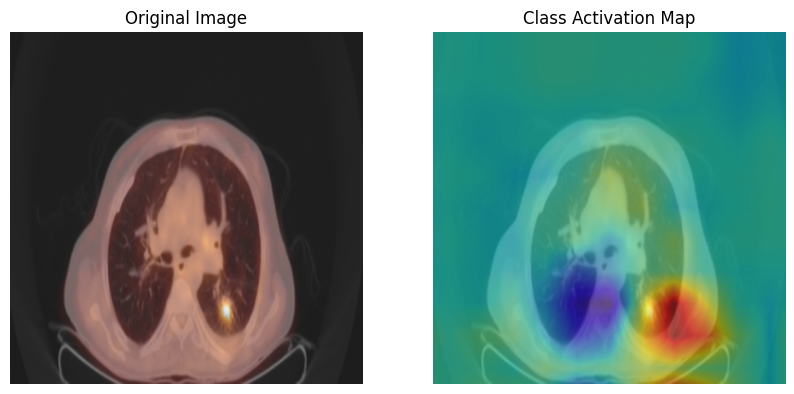

1/1 [==============================] - 0s 37ms/step


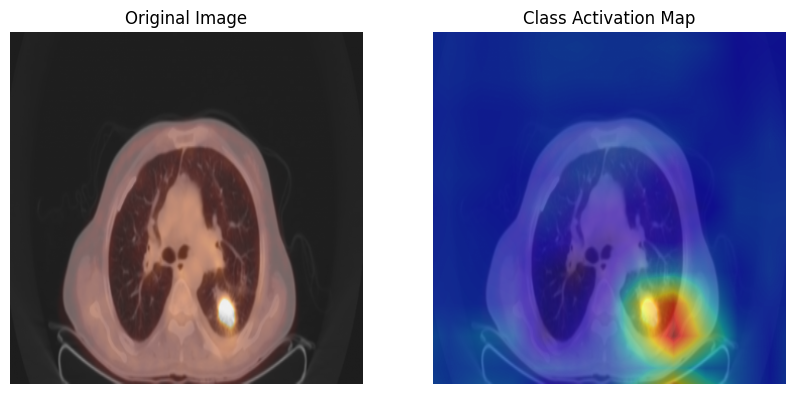

In [19]:
loaded_model = model

output_directory = '/content/sample_data'

fileNames = os.listdir('/content/drive/MyDrive/sampleImagesFromTestSet')
filePaths = []


for i in fileNames:
    path = '/content/drive/MyDrive/sampleImagesFromTestSet/'
    new_path = path + i
    filePaths.append(new_path)

for fn in filePaths:
    img = io.imread(fn)
    img_resized = resize(img, (image_height, image_width), anti_aliasing=True)  
    img_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    img_tensor = np.expand_dims(img_array, axis=0)

    predictions = loaded_model.predict(img_tensor)
    label_index = np.argmax(predictions)

    class_weights = loaded_model.layers[-1].get_weights()[0]
    class_weights_winner = class_weights[:, label_index]
    final_conv_layer = loaded_model.get_layer("post_relu")

    get_output = K.function([loaded_model.layers[0].input], [final_conv_layer.output, loaded_model.layers[-1].output])
    [conv_outputs, predictions] = get_output([img_tensor])
    conv_outputs = np.squeeze(conv_outputs)

    target_size = final_conv_layer.output_shape[1:3]  
    mat_for_mult = scipy.ndimage.zoom(conv_outputs, (target_size[0] / conv_outputs.shape[0], target_size[1] / conv_outputs.shape[1], 1), order=1)

    cam = np.dot(mat_for_mult.reshape((-1, conv_outputs.shape[-1])), class_weights_winner).reshape(target_size)
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    cam_resized = resize(cam, img_resized.shape[:2], mode='reflect', anti_aliasing=True)

    heatmap = plt.cm.jet(cam_resized)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img_resized)
    axes[0].axis('off')
    axes[0].set_title('Original Image')
    axes[1].imshow(img_resized)
    axes[1].imshow(heatmap, alpha=0.5)
    axes[1].axis('off')
    axes[1].set_title('Class Activation Map')
    plt.show()

    filename = fn.split('/')[-1].split('.')[0]
    save_path = f"{output_directory}{filename}_heatmap.png"

    fig.savefig(save_path, dpi=600, bbox_inches='tight')
    plt.close(fig)

Saving 0000216 (1).tif to 0000216 (1).tif
1/1 [==============================] - 0s 33ms/step


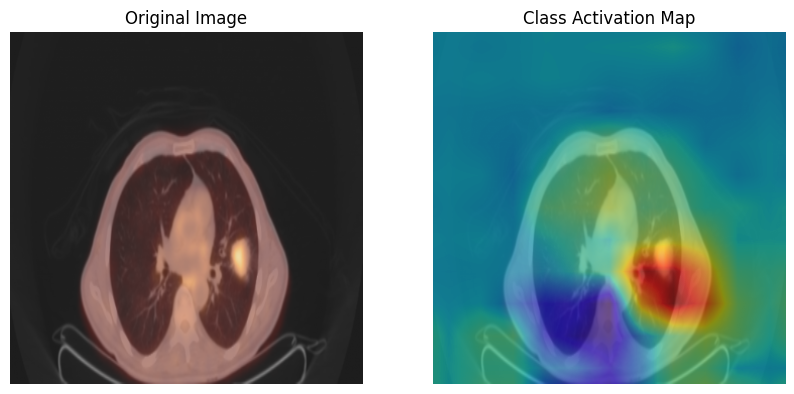

In [21]:
uploaded=files.upload()

for fn in uploaded.keys():
    path='/content/' + fn
    img = io.imread(path)
    img_resized = resize(img, (image_height, image_width), anti_aliasing=True)  
    img_array = tf.keras.preprocessing.image.img_to_array(img_resized)
    img_tensor = np.expand_dims(img_array, axis=0)

    predictions = loaded_model.predict(img_tensor)
    label_index = np.argmax(predictions)

    class_weights = loaded_model.layers[-1].get_weights()[0]
    class_weights_winner = class_weights[:, label_index]
    final_conv_layer = loaded_model.get_layer("post_relu")

    get_output = K.function([loaded_model.layers[0].input], [final_conv_layer.output, loaded_model.layers[-1].output])
    [conv_outputs, predictions] = get_output([img_tensor])
    conv_outputs = np.squeeze(conv_outputs)

    target_size = final_conv_layer.output_shape[1:3]  
    mat_for_mult = scipy.ndimage.zoom(conv_outputs, (target_size[0] / conv_outputs.shape[0], target_size[1] / conv_outputs.shape[1], 1), order=1)

    cam = np.dot(mat_for_mult.reshape((-1, conv_outputs.shape[-1])), class_weights_winner).reshape(target_size)
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    cam_resized = resize(cam, img_resized.shape[:2], mode='reflect', anti_aliasing=True)

    heatmap = plt.cm.jet(cam_resized)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img_resized)
    axes[0].axis('off')
    axes[0].set_title('Original Image')
    axes[1].imshow(img_resized)
    axes[1].imshow(heatmap, alpha=0.5)
    axes[1].axis('off')
    axes[1].set_title('Class Activation Map')
    plt.show()

    filename = fn.split('/')[-1].split('.')[0]
    save_path = f"{output_directory}{filename}_heatmap.png"

    fig.savefig(save_path, dpi=600, bbox_inches='tight')
    plt.close(fig)